In [63]:
#!pip install pydoe
#!gdown --id 1O1k57hOipLRHW1icIZEFFm31dGaEFsQa -O model_utils.py
#!gdown --id 1-t4mOfZvlEVgexAe5PM7FCrfzXgWPkVz -O pwlf_mod.py

In [89]:
import model_utils as mu
mu.DEATH_RATE = 1.25
mu.ICU_RATE = 3.75
mu.HOSPITAL_RATE = 7.5
mu.SYMPTOM_RATE = 12.5
mu.INCUBATE_TIME = 4
mu.INFECT_2_HOSPITAL_TIME = 11
mu.HOSPITAL_2_ICU_TIME = 4
mu.ICU_2_DEATH_TIME = 4
mu.ICU_2_RECOVER_TIME = 7
mu.NOT_ICU_DISCHARGE_TIME = 5
mu.REPORT_RATE = 0.3
mu.SHEET_URL = "https://docs.google.com/spreadsheets/d/1430UkgyMosWnU3rMWxPvxhfUR5YNuuLV2SkRA5fn9fs/edit#gid=875032422"
#mu.SHEET_URL = "https://docs.google.com/spreadsheets/d/1XG5xqZS8O7o1XKbSxyOpiYLRnGSh8roJgfhdOmaIkso/edit#gid=1965411707"

In [90]:
import pandas as pd
import numpy as np
import pwlf_mod as pwlf
import datetime as dt
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [91]:
#Use plotly
import plotly.offline as py_offline
import cufflinks as cf
cf.go_offline()
py_offline.__PLOTLY_OFFLINE_INITIALIZED = True

In [92]:
# Add for Google Colab
#import plotly
#plotly.io.renderers.default = 'colab'

In [93]:
import imp; imp.reload(mu)

<module 'model_utils' from '/home/quoc/github/Covid19_VN/model_utils.py'>

In [94]:
sheet_url = "https://docs.google.com/spreadsheets/d/1iviYd0Cha8K2bHkVTtSwyo9fxrusqaMfm6QP-Iw75Eg/edit#gid=0"
sheet_url = "https://docs.google.com/spreadsheets/d/1itEerwNBiPovo3yiTiFcAnxZMQ6YUSZ_Wps_jfShs3Q/export?format=csv"
sheet_url = "https://docs.google.com/spreadsheets/d/1XmbTAe6D73JQ_JjiqJrpjdn0vxVikm-On_6v7OU44rI/edit#gid=1033902770"

In [95]:
def get_data_vn(data_file = mu.SHEET_URL):
    data_file_new = data_file.replace('/edit#gid=', '/export?format=csv&gid=')
    #print(url_1)
    data = pd.read_csv(data_file_new, sep=',').set_index('date')
    data.index = pd.to_datetime(data.index)
    return data.sort_index()
def get_data_vn_by_province(province='TPHCM', district='All', data_file = mu.SHEET_URL):
    vn_data = get_data_vn(data_file=data_file)
    if district == 'All':
        local_data = vn_data.query('tinh_thanh == "{}"'.format(province)).iloc[:,:].sort_index().sum(level='date')
    else:
        local_data = vn_data.query('tinh_thanh == "{}" and quan_huyen == "{}"'.format(province, district))\
                         .iloc[:,:].sort_index().sum(level='date')
    idx = pd.date_range(min(local_data.index), max(local_data.index))
    local_data = local_data.reindex(idx, fill_value=0)
    return local_data

In [96]:
def get_avg_data(data, smoothing_days=7, col_suffix='_avg'):
    idx = pd.date_range(min(data.index)+dt.timedelta(-smoothing_days), max(data.index))
    data_avg = data.reindex(idx, fill_value=0).rolling(smoothing_days, min_periods=1).mean()
    data_avg.columns = data_avg.columns + col_suffix
    return data_avg[min(data.index):max(data.index)]

In [97]:
def get_transformed_data(data, smoothing_days=7):
    # Turn 0 to nan to avoid log of 0
    data_avg = get_avg_data(data, smoothing_days=smoothing_days)
    data_avg[data_avg<= 0.01] = np.nan
    return np.log(data_avg)

In [98]:
def predict(data, forecast_horizon=30, policy_effective_dates=[], smoothing_days=7,  effective_rate=0.8):
    '''Since this is highly contagious disease. Daily new death, which is a proxy for daily new infected cases
    is model as d(t)=a*d(t-1) or equivalent to d(t) = b*a^(t). After a log transform, it becomes linear.
    log(d(t))=logb+t*loga, so we can use linear regression to provide forecast (use robust linear regressor to avoid
    data anomaly in death reporting)
    There are two separate linear curves, one before the lockdown is effective(21 days after lockdown) and one after
    For using this prediction to infer back the other metrics (infected cases, hospital, ICU, etc..) only the before
    curve is used and valid. If we assume there is no new infection after lock down (perfect lockdown), the after
    curve only depends on the distribution of time to death since ICU.
    WARNING: if lockdown_date is not provided, we will default to no lockdown to raise awareness of worst case
    if no action. If you have info on lockdown date please use it to make sure the model provide accurate result'''
    #for policy_effective_date in policy_effective_dates:
    #    data = data.loc[
    #        (data.index > policy_effective_date + dt.timedelta(smoothing_days)) |
    #        (data.index <= policy_effective_date)]

    data.dropna(inplace=True)
    data_start_date = min(data.index)
    data_end_date = max(data.index)
    forecast_end_date = data_end_date + dt.timedelta(forecast_horizon)
    forecast_date_index = pd.date_range(start=data_start_date, end=forecast_end_date)

    data_start_date_idx = 0
    data_end_date_idx = (data_end_date - data_start_date).days
    forecast_end_date_idx = data_end_date_idx + forecast_horizon
    forecast_time_idx = (forecast_date_index - data_start_date).days.values
    data_time_idx = (data.index - data_start_date).days.values
    policy_effective_dates_idx = (policy_effective_dates - data_start_date).days.values
    data['time_idx'] = data_time_idx
    #import pdb; pdb.set_trace()
    data = data.replace([np.inf, -np.inf], np.nan).dropna()
    break_points = np.array([data_start_date_idx, ] +
                            policy_effective_dates_idx[(~np.isnan(policy_effective_dates_idx))&
                                                       (policy_effective_dates_idx < forecast_end_date_idx)].tolist() +
                            [forecast_end_date_idx, ])
    regr_pw = pwlf.PiecewiseLinFit(x=data.time_idx.values, y=data.iloc[:,0])
    regr_pw.fit_with_breaks(break_points)
    model_beta = regr_pw.beta
    log_predicted_var = smoothing_days * regr_pw.prediction_variance(forecast_time_idx)

    # Use default slope when data is not enough to fit last line, less than 4 data point, with contain_rate=1 mean slope
    # is the same as previous slope (same policy) and 0 mean (relax 100%) slope will be same as before lockdown

    #if ((data_end_date_idx-break_points[-2]) < 4) | (model_beta[-1] > max(0.3, abs(model_beta[1]))):
    if ((data_end_date_idx-break_points[-2]) < 4) | (model_beta[-1] > max(1, abs(model_beta[1]))):
        if model_beta[-2] < 0:
            model_beta[-1] = model_beta[-2]*effective_rate
        else:
            model_beta[-1] = (-model_beta[-2])*(1+effective_rate)
        print("Use default last slope due to not enough data")
        #import pdb; pdb.set_trace()
        variance = log_predicted_var[sum(forecast_time_idx <= break_points[-2])]
        log_predicted_var_oos = variance * (forecast_time_idx[forecast_time_idx > break_points[-2]] -
                                                       break_points[-2])
        log_predicted_var = np.concatenate(
                (log_predicted_var[:sum(forecast_time_idx <= break_points[-2])],
                 log_predicted_var_oos))

    log_predicted_values = regr_pw.predict(forecast_time_idx, beta=model_beta, breaks=break_points)

    log_predicted_lower_bound_values = log_predicted_values - 1.96 * np.sqrt(log_predicted_var)
    log_predicted_upper_bound_values = log_predicted_values + 1.96 * np.sqrt(log_predicted_var)

    log_predicted = pd.DataFrame(log_predicted_values, index=forecast_date_index)
    log_predicted_lower_bound = pd.DataFrame(log_predicted_lower_bound_values, index=forecast_date_index)
    log_predicted_upper_bound = pd.DataFrame(log_predicted_upper_bound_values, index=forecast_date_index)
    log_predicted.columns = ['predicted']
    log_predicted_lower_bound.columns = ['lower_bound']
    log_predicted_upper_bound.columns = ['upper_bound']
    return pd.concat([log_predicted, log_predicted_lower_bound, log_predicted_upper_bound], axis=1, sort=True), regr_pw.beta


In [99]:
def get_infected_cases_from_symptom_cases(symptom_cases, col_suffix='_infected'):
    '''This number only is close to number of confirmed case in country very early in the disease and 
    can still do contact tracing or very wide testing, eg. South Korea, Germany, Vietnam'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME - mu.INCUBATE_TIME
    infected_cases = (100/mu.SYMPTOM_RATE/mu.REPORT_RATE)*symptom_cases.tshift(-delay_time)
    infected_cases.columns = infected_cases.columns + col_suffix
    return infected_cases


In [100]:
def get_new_hospitalized_cases_from__infected_cases(infected_cases, col_suffix='_new_hospitalized'):
    '''In country with severe lack of testing, this is close to number of confirmed case, eg. Italy, Iran'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME
    hospitalized_cases = (mu.HOSPITAL_RATE/100)*infected_cases.tshift(delay_time)
    hospitalized_cases.rename(columns=lambda x: x.replace('_infected', col_suffix), inplace=True)
    return hospitalized_cases


In [101]:
def get_new_ICU_cases_from__infected_cases(infected_cases, col_suffix='_new_ICU'):
    '''In country with severe lack of healthcare facility (#ICU) this is very close to death cases'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME + mu.HOSPITAL_2_ICU_TIME
    ICU_cases = (mu.ICU_RATE/100)*infected_cases.tshift(delay_time)
    ICU_cases.rename(columns=lambda x: x.replace('_infected', col_suffix), inplace=True)
    return ICU_cases

In [102]:
def get_death_cases_from__infected_cases(infected_cases, col_suffix='_death'):
    '''In country with severe lack of healthcare facility (#ICU) this is very close to death cases'''
    delay_time = mu.INFECT_2_HOSPITAL_TIME + mu.HOSPITAL_2_ICU_TIME + mu.ICU_2_DEATH_TIME
    death_cases = (mu.DEATH_RATE/100)*infected_cases.tshift(delay_time)
    death_cases.rename(columns=lambda x: x.replace('_infected', col_suffix), inplace=True)
    return death_cases

In [103]:
def get_metrics_VN(province='TPHCM', district='All', data_file=mu.SHEET_URL, data = None,
                   forecast_horizon=30, policy_change_dates=[], effective_rate=0.8,
                   test_rate=0.2, back_test=False, last_data_date=dt.date.today()):
    if data is None:
        data = get_data_vn_by_province(province=province, district=district, data_file=data_file)[['f0', 'f0_community']]
    data_avg = get_avg_data(data)
    data_orig = pd.concat([data, data_avg], axis=1, sort=True)
    data_start = min(data.index.date)
    if back_test:
        data = data[data.index.date <= last_data_date]
    log_data = get_transformed_data(data)#.iloc[4:]
    policy_effective_dates = pd.to_datetime(policy_change_dates) + dt.timedelta(
            mu.INFECT_2_HOSPITAL_TIME)
    predicted_log_f0_community, beta = predict(log_data[['f0_community_avg']], 
                                               policy_effective_dates=policy_effective_dates, 
                                               effective_rate=effective_rate,
                                               forecast_horizon=forecast_horizon)
    log_f0 = pd.concat([predicted_log_f0_community, log_data], axis=1, sort=True)
    log_f0_ve = log_f0.rename(columns={'f0_community_avg': 'Log(F0 tầm soát có triệu chứng)', 'predicted': 'Dự báo Log(F0 tầm soát có triệu chứng)',
                          'lower_bound': 'Cận dưới Log(F0 tầm soát có triệu chứng)', 'upper_bound': 'Cận trên Log(F0 tầm soát có triệu chứng)', 'f0_avg':'Log(F0)'})\
        .drop(columns=['ICU_current_avg'], errors='ignore')
    symptom_cases = np.exp(predicted_log_f0_community)
    infected_cases = get_infected_cases_from_symptom_cases(symptom_cases)
    new_hospitalized_cases = get_new_hospitalized_cases_from__infected_cases(infected_cases)
    new_ICU_cases = get_new_ICU_cases_from__infected_cases(infected_cases)
    death_cases = get_death_cases_from__infected_cases(infected_cases)
    f0 = pd.concat([data_orig,
                    symptom_cases,
                    infected_cases,
                    new_hospitalized_cases,
                    new_ICU_cases,
                    death_cases
                    ], axis=1, sort=True)

    f0_ve = f0.rename(columns={'f0_community': 'F0 tầm soát có triệu chứng', 
                               'predicted': 'Dự báo F0 tầm soát có triệu chứng', 
                               'predicted_infected': 'Dự báo ca thực nhiễm',
                               'lower_bound': 'Cận dưới F0 tầm soát có triệu chứng', 
                               'upper_bound': 'Cận trên F0 tầm soát có triệu chứng', 
                               'f0':'F0', 
                               'upper_bound_infected': 'Cận trên dự báo ca thực nhiễm',  
                               'lower_bound_infected': 'Cận dưới dự báo ca thực nhiễm',
                               'f0_avg': 'Trung bình 7 ngày F0',
                               'f0_community_avg': 'Trung bình 7 ngày F0 tầm soát có triệu chứng',
                               'predicted_new_hospitalized': 'Dự báo ca nhập viện',
                               'upper_bound_new_hospitalized': 'Cận trên dự báo ca nhập viện',  
                               'lower_bound_new_hospitalized': 'Cận dưới dự báo ca nhập viện',
                               'predicted_new_ICU': 'Dự báo ca chuyển ICU',
                               'upper_bound_new_ICU': 'Cận trên dự báo ca chuyển ICU',  
                               'lower_bound_new_ICU': 'Cận dưới dự báo ca chuyển ICU',
                               'predicted_death': 'Dự báo ca tử vong',
                               'upper_bound_death': 'Cận trên dự báo ca tử vong',  
                               'lower_bound_death': 'Cận dưới dự báo ca tử vong'
                          })\
        .drop(columns=['ICU_current'], errors='ignore').fillna(value={'F0':0})
    f0_ve['F0'][f0_ve.index.date>=dt.date.today()] = np.nan 
    f0_ve['Dự báo ca thực nhiễm'][f0_ve.index.date<data_start] = np.nan
    f0_ve['Cận trên dự báo ca thực nhiễm'][f0_ve.index.date<data_start] = np.nan
    f0_ve['Cận dưới dự báo ca thực nhiễm'][f0_ve.index.date<data_start] = np.nan
    #if back_test:
    #    f0_ve['F0 tầm soát'] = data_orig['f0_community']
    #    f0_ve['7d_avg_death'] = data_orig.rolling(7, min_periods=3).mean()

    cumulative_f0_ve = f0_ve.drop(columns=['ICU', 'hospital_beds'], errors='ignore').cumsum()
 
    #cumulative_metrics['ICU'] = daily_metrics['ICU']
    #cumulative_metrics['hospital_beds'] = daily_metrics['hospital_beds']
    print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: {last}'.format(last=np.exp(sum(beta[1:]))))
    return log_f0_ve, f0_ve, cumulative_f0_ve, beta


In [110]:
get_data_vn_by_province()

,f0,f0_community
2021-07-10,1925,101
2021-07-11,1371,126
2021-07-12,1566,99
2021-07-13,1830,153
2021-07-14,2239,107
2021-07-15,3169,244


In [111]:
log_f0_ve, f0_ve, cumulative_f0_ve, beta = get_metrics_VN(policy_change_dates =['2021-06-01'], forecast_horizon=60)#,  last_data_date=pd.to_datetime('2021-06-28'), back_test=True)

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.4816909298621155


In [112]:
f0_ve.iplot()

In [113]:
log_f0_ve.iplot()

In [114]:
cumulative_f0_ve.iplot()


# Kịch  bản 



In [234]:
policy_change_dates_full =['2021-06-01', '2021-06-20']

## Kịch  bản hiệu quả cao

In [235]:
log_f0_ve_kbc, f0_ve_kbc, cumulative_f0_ve_kbc, beta = get_metrics_VN(policy_change_dates = policy_change_dates_full, effective_rate=0.9,forecast_horizon=60)
##print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: {last}'.format(last=np.exp(sum(beta[1:]))))
f0_ve_kbc.iplot(title = "Biểu độ dự báo tình hình lây nhiễm - kịch bản hiệu quả cao")
log_f0_ve_kbc.iplot(title = "Biểu độ dự báo tình hình lây nhiễm theo Log scale - kịch bản hiệu quả cao")
cumulative_f0_ve_kbc.iplot(title = "Biểu độ tổng số ca - kịch bản hiệu quả cao")

Use default last slope due to not enough data
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9629492642504196


## Kịch  bản hiệu quả thấp

In [236]:
log_f0_ve_kbt, f0_ve_kbt, cumulative_f0_ve_kbt, beta = get_metrics_VN(policy_change_dates = policy_change_dates_full,
                                                                     effective_rate=0.3)
#print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: {last}'.format(last=np.exp(sum(beta[1:]))))
log_f0_ve_kbt.iplot(title = "Biểu độ dự báo tình hình lây nhiễm theo Log scale kịch  bản hiệu quả thấp ")
f0_ve_kbt.iplot(title = "Biểu độ dự báo tình hình lây nhiễm  kịch  bản hiệu quả thấp ")
cumulative_f0_ve_kbt.iplot(title = "Biểu độ tổng số ca kịch  bản hiệu quả thấp ")

Use default last slope due to not enough data
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0308668040286448


#Quận / Huyện nguy cơ cao 

In [215]:
qh = get_data_vn().query('date>="2021-06-12"').groupby('quan_huyen').sum().sort_values('f0_community', ascending=False)
#qh['tc_vs_f0'] = qh.f0_community/qh.f0
bang = qh.drop(columns=['cong_dong', 'nhap_canh'], errors='ignore').sort_values('f0_community', ascending=False)
bang

,f0,f0_community,khu_cach_ly,khu_phong_toa,trieu_chung,sang_loc_tai_bv,dang_xac_minh_hay_dieu_tra,cach_ly_tai_nha
quan_huyen,,,,,,,,
HOC MON,514,35,146,157,30,142,40,0
BINH TAN,1012,28,549,289,48,82,62,0
8,419,14,294,46,30,50,11,0
TAN PHU,281,13,112,78,27,19,54,0
1,359,12,129,178,16,27,8,16
10,100,12,41,3,11,23,13,0
BINH CHANH,619,12,397,91,24,40,67,0
12,227,12,125,65,35,26,3,0
4,223,10,67,124,13,29,1,0


In [216]:
top = bang.query('f0_community>=3')
top

,f0,f0_community,khu_cach_ly,khu_phong_toa,trieu_chung,sang_loc_tai_bv,dang_xac_minh_hay_dieu_tra,cach_ly_tai_nha
quan_huyen,,,,,,,,
HOC MON,514,35,146,157,30,142,40,0
BINH TAN,1012,28,549,289,48,82,62,0
8,419,14,294,46,30,50,11,0
TAN PHU,281,13,112,78,27,19,54,0
1,359,12,129,178,16,27,8,16
10,100,12,41,3,11,23,13,0
BINH CHANH,619,12,397,91,24,40,67,0
12,227,12,125,65,35,26,3,0
4,223,10,67,124,13,29,1,0


In [217]:
R0_before = []
R0_after = []
F0_gap = []
F0_gap_upper = []
F0_est = []
for district in top.index.values:
  log_f0_ve_qh, f0_ve_qh, cumulative_f0_ve_qh, beta_qh = get_metrics_VN(district=district, policy_change_dates = ['2021-06-01'])#, last_data_date=pd.to_datetime('2021-06-25'), back_test=True)
  last_cummulative = cumulative_f0_ve_qh.loc[str(dt.date.today()+dt.timedelta(-1))]
  R0_after_qh = np.exp(sum(beta_qh[1:]))
  R0_before_qh = np.exp(beta_qh[1])
  R0_before.append(R0_before_qh)
  R0_after.append(R0_after_qh)
  F0_est.append(last_cummulative["Dự báo ca thực nhiễm"])
  F0_gap.append(last_cummulative["Dự báo ca thực nhiễm"]-last_cummulative.F0)
  F0_gap_upper.append(last_cummulative["Cận trên dự báo ca thực nhiễm"]-last_cummulative.F0)
  print('Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: {last}'.format(last=R0_after_qh))
  print('Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: {before}'.format(before=R0_before_qh))
  f0_ve_qh.iplot(title = "Biểu độ dự báo tình hình lây nhiễm Quận/Huyện " + district)
  log_f0_ve_qh.iplot(title = "Biểu độ dự báo tình hình lây nhiễm theo Log scale Quận/Huyện {}, R0 Trước {}, R0 sau {}".format(district, R0_before_qh,R0_after_qh))
  cumulative_f0_ve_qh.iplot(title = "Biểu độ tổng số ca Quận/Huyện "+ district)

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.083800095623891
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.083800095623891
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.097703516473677


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0789930732352868
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0789930732352868
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0364940996720657


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0859450919908902
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0859450919908902
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.8765899957353154


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9569498358489168
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9569498358489168
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.3024411028281104


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0831002501537024
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0831002501537024
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0578917953219322


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0238556331837072
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0238556331837072
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.693200266940778


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1055017672361678
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.1055017672361678
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0514284413293031


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9882292986017415
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9882292986017415
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0546700921314403


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1435631588432726
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.1435631588432726
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.7877115024692818


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9917081140930932
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9917081140930932
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.174157547277646


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.00408524930889
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.00408524930889
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0930752043198861


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.022436676460618
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.022436676460618
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.132705595882485


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0366698458728787
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0366698458728787
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.0725787361916974


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0763057750002742
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0763057750002742
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9962477024810713


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9953485235423561
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9953485235423561
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.1710692850823172


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0577663439337397
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0577663439337397
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.5689759678643087


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9923448921902935
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9923448921902935
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.9749597965021516


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9848814464691319
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 0.9848814464691319
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.869232322705438


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0295101416537584
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0295101416537584
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 0.8634948978973641


Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0171789228125678
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 sau: 1.0171789228125678
Hệ số lây nhiễm trước khi chỉ thị có hiệu lực, R0 trước: 1.142164482348956


In [218]:
top["F0_gap"]  =  F0_gap
top["F0_gap_upper"]  =  F0_gap_upper

In [219]:
top["R0 trước  12/6"]  =  R0_before
top["R0"]  =  R0_after
top["F0_est"]  =  F0_est

In [220]:
bang.sort_values('f0_community', ascending=False)

,f0,f0_community,khu_cach_ly,khu_phong_toa,trieu_chung,sang_loc_tai_bv,dang_xac_minh_hay_dieu_tra,cach_ly_tai_nha
quan_huyen,,,,,,,,
HOC MON,514,35,146,157,30,142,40,0
BINH TAN,1012,28,549,289,48,82,62,0
8,419,14,294,46,30,50,11,0
TAN PHU,281,13,112,78,27,19,54,0
1,359,12,129,178,16,27,8,16
10,100,12,41,3,11,23,13,0
BINH CHANH,619,12,397,91,24,40,67,0
12,227,12,125,65,35,26,3,0
4,223,10,67,124,13,29,1,0


In [221]:
top = top.rename(columns={'f0_community':'Ca tầm soát có triệu chứng'}).sort_values('Ca tầm soát có triệu chứng', ascending=False)
top

,f0,Ca tầm soát có triệu chứng,khu_cach_ly,khu_phong_toa,trieu_chung,sang_loc_tai_bv,dang_xac_minh_hay_dieu_tra,cach_ly_tai_nha,F0_gap,F0_gap_upper,R0 trước 12/6,R0,F0_est
quan_huyen,,,,,,,,,,,,,
HOC MON,514,35,146,157,30,142,40,0,1907.383278,6816.311114,1.097704,1.083800,2462.383278
BINH TAN,1012,28,549,289,48,82,62,0,871.250287,5863.073705,1.036494,1.078993,1923.250287
8,419,14,294,46,30,50,11,0,722.740376,20910.091064,0.876590,1.085945,1165.740376
TAN PHU,281,13,112,78,27,19,54,0,131.779120,624.072792,1.302441,0.956950,454.779120
1,359,12,129,178,16,27,8,16,513.867196,3111.257741,1.057892,1.083100,884.867196
10,100,12,41,3,11,23,13,0,349.270592,972.424258,0.693200,1.023856,452.270592
BINH CHANH,619,12,397,91,24,40,67,0,484.683537,5807.308327,1.051428,1.105502,1120.683537
12,227,12,125,65,35,26,3,0,274.881453,1018.857421,1.054670,0.988229,559.881453
4,223,10,67,124,13,29,1,0,1311.111301,24792.970976,0.787712,1.143563,1535.111301


In [222]:
top.sort_values('F0_gap', ascending=False)

,f0,Ca tầm soát có triệu chứng,khu_cach_ly,khu_phong_toa,trieu_chung,sang_loc_tai_bv,dang_xac_minh_hay_dieu_tra,cach_ly_tai_nha,F0_gap,F0_gap_upper,R0 trước 12/6,R0,F0_est
quan_huyen,,,,,,,,,,,,,
HOC MON,514,35,146,157,30,142,40,0,1907.383278,6816.311114,1.097704,1.083800,2462.383278
4,223,10,67,124,13,29,1,0,1311.111301,24792.970976,0.787712,1.143563,1535.111301
BINH TAN,1012,28,549,289,48,82,62,0,871.250287,5863.073705,1.036494,1.078993,1923.250287
8,419,14,294,46,30,50,11,0,722.740376,20910.091064,0.876590,1.085945,1165.740376
7,88,7,49,4,9,16,16,0,571.307450,1521.113282,0.996248,1.076306,671.307450
1,359,12,129,178,16,27,8,16,513.867196,3111.257741,1.057892,1.083100,884.867196
BINH CHANH,619,12,397,91,24,40,67,0,484.683537,5807.308327,1.051428,1.105502,1120.683537
10,100,12,41,3,11,23,13,0,349.270592,972.424258,0.693200,1.023856,452.270592
TAN BINH,181,10,96,30,11,20,31,0,303.416957,947.719932,1.174158,0.991708,545.416957


In [223]:
top.sort_values('F0_gap_upper', ascending=False)

,f0,Ca tầm soát có triệu chứng,khu_cach_ly,khu_phong_toa,trieu_chung,sang_loc_tai_bv,dang_xac_minh_hay_dieu_tra,cach_ly_tai_nha,F0_gap,F0_gap_upper,R0 trước 12/6,R0,F0_est
quan_huyen,,,,,,,,,,,,,
4,223,10,67,124,13,29,1,0,1311.111301,24792.970976,0.787712,1.143563,1535.111301
8,419,14,294,46,30,50,11,0,722.740376,20910.091064,0.876590,1.085945,1165.740376
HOC MON,514,35,146,157,30,142,40,0,1907.383278,6816.311114,1.097704,1.083800,2462.383278
BINH TAN,1012,28,549,289,48,82,62,0,871.250287,5863.073705,1.036494,1.078993,1923.250287
BINH CHANH,619,12,397,91,24,40,67,0,484.683537,5807.308327,1.051428,1.105502,1120.683537
1,359,12,129,178,16,27,8,16,513.867196,3111.257741,1.057892,1.083100,884.867196
7,88,7,49,4,9,16,16,0,571.307450,1521.113282,0.996248,1.076306,671.307450
11,72,7,24,14,12,12,19,0,271.991915,1349.497820,1.072579,1.036670,348.991915
3,107,4,33,55,7,12,5,0,70.683290,1101.895065,0.863495,1.029510,186.683290


In [224]:
top.sort_values('R0', ascending=False)

,f0,Ca tầm soát có triệu chứng,khu_cach_ly,khu_phong_toa,trieu_chung,sang_loc_tai_bv,dang_xac_minh_hay_dieu_tra,cach_ly_tai_nha,F0_gap,F0_gap_upper,R0 trước 12/6,R0,F0_est
quan_huyen,,,,,,,,,,,,,
4,223,10,67,124,13,29,1,0,1311.111301,24792.970976,0.787712,1.143563,1535.111301
BINH CHANH,619,12,397,91,24,40,67,0,484.683537,5807.308327,1.051428,1.105502,1120.683537
8,419,14,294,46,30,50,11,0,722.740376,20910.091064,0.876590,1.085945,1165.740376
HOC MON,514,35,146,157,30,142,40,0,1907.383278,6816.311114,1.097704,1.083800,2462.383278
1,359,12,129,178,16,27,8,16,513.867196,3111.257741,1.057892,1.083100,884.867196
BINH TAN,1012,28,549,289,48,82,62,0,871.250287,5863.073705,1.036494,1.078993,1923.250287
7,88,7,49,4,9,16,16,0,571.307450,1521.113282,0.996248,1.076306,671.307450
5,163,5,25,115,7,9,0,0,142.322879,740.181534,0.568976,1.057766,308.322879
11,72,7,24,14,12,12,19,0,271.991915,1349.497820,1.072579,1.036670,348.991915


# Tóm tắt

Số  ca lây nhiễm được tầm soát trong cộng đồng cho thấy mức độ lây nhiễm thực sự của Covid19 ở TP

Với cùng một chính sách giãn cách xã hội, đường logarithm của số ca lây nhiễm được tầm soát trong cộng đồng là đường thẳng, ta tạm gọi là "đường lây nhiễm". 

Đường lây nhiễm này thay đổi 11 ngày sau khi một chính sách mới có hiệu lực. 11 ngày là số ngày từ lúc bắt đầu nhiễm đến lúc có triệu chứng rõ rệt phải đi khám ở bệnh viện.

Sau khi TP thực hiện chỉ thị 15+ 16 (Gò Vấp, Q12) ngày 1/6, đường lây nhiễm có thay đổi kể từ ngày 12/6 nhưng chưa đi xuống

11 ngày sau khi thực hiện chỉ thị 10 của thành phố, đường lây nhiễm này sẽ thay đổi.

Tóm tắt về đường cam và đường xanh 

# Vẽ Biểu Đồ Tối Ưu Cho Report (thay vì Tương Tác)

In [61]:
import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import seaborn as sns
import IPython
%matplotlib inline
IPython.display.set_matplotlib_formats('svg')
pd.plotting.register_matplotlib_converters()

def plotCasesLog(log_f0_ve, place=''):
    fig, ax = plt.subplots(figsize=(12, 4))
    sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.linewidth': 0.5})
    sns.set_context("notebook", rc={"lines.linewidth": 1.75})
    palette = sns.color_palette("tab10", n_colors=3)
    style_order = ['Log(F0 tầm soát có triệu chứng)', 'Dự báo Log(F0 tầm soát có triệu chứng)', 'Log(F0)']
    z_order = ['Log(F0)', 'Dự báo Log(F0 tầm soát có triệu chứng)', 'Log(F0 tầm soát có triệu chứng)']
    sns.lineplot(data=log_f0_ve[z_order], style_order=style_order,
                palette=palette, dashes=True, markers=True)
    plt.fill_between(x=log_f0_ve.index, 
                     y1=log_f0_ve['Cận dưới Log(F0 tầm soát có triệu chứng)'], 
                     y2=log_f0_ve['Cận trên Log(F0 tầm soát có triệu chứng)'],
                     alpha=0.1, color=palette[1], edgecolor='face')
    ax.set_xlim(xmax=datetime.date(2021, 7, 30))
    #ax.set_ylim(ymin=0)
    ax.set_xlabel('Ngày (theo tuần)')
    ax.set_ylabel('Số ca (theo hàm log)')
    ax.set_title('Biểu đồ dự báo tình hình lây nhiễm ' + place, fontsize=18)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0, interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))

def plotCases(f0_ve, place=''):
    fig, (axt, ax) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8), sharex=True)
    sns.set_style("whitegrid", {'grid.linestyle': '--', 'grid.linewidth': 0.5})
    sns.set_context("notebook", rc={"lines.linewidth": 1.75})
    palette = sns.color_palette("tab10", n_colors=3)

    style_order = ['F0 tầm soát có triệu chứng', 'Trung bình 7 ngày F0 tầm soát có triệu chứng', 'Dự báo F0 tầm soát có triệu chứng']
    z_order = ['F0 tầm soát có triệu chứng', 'Trung bình 7 ngày F0 tầm soát có triệu chứng', 'Dự báo F0 tầm soát có triệu chứng']
    sns.lineplot(data=f0_ve[z_order], style_order=style_order,
                palette=palette, dashes=True, markers=True, ax=axt)
    axt.fill_between(x=f0_ve.index, 
                     y1=f0_ve['Cận dưới F0 tầm soát có triệu chứng'], 
                     y2=f0_ve['Cận trên F0 tầm soát có triệu chứng'],
                     alpha=0.1, color=palette[1], edgecolor='face')
    axt.set_xlim(xmax=datetime.date(2021, 7, 30))
    axt.set_ylim(ymin=0, ymax=100)
    axt.set_xlabel('Ngày (theo tuần)')
    axt.set_ylabel('Số ca')
    axt.set_title('Biểu đồ dự báo tình hình lây nhiễm '+place, fontsize=18)
    axt.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0, interval=1))
    axt.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))

    style_order = ['F0', 'Trung bình 7 ngày F0', 'Dự báo ca thực nhiễm']
    z_order = ['F0', 'Trung bình 7 ngày F0', 'Dự báo ca thực nhiễm']
    sns.lineplot(data=f0_ve[z_order], style_order=style_order,
                palette=palette, dashes=True, markers=True, ax=ax)
    ax.fill_between(x=f0_ve.index, 
                     y1=f0_ve['Cận dưới dự báo ca thực nhiễm'], 
                     y2=f0_ve['Cận trên dự báo ca thực nhiễm'],
                     alpha=0.1, color=palette[1], edgecolor='face')
    ax.set_xlim(xmax=datetime.date(2021, 7, 11))
    ax.set_ylim(ymin=0, ymax=750)
    ax.set_xlabel('Ngày (theo tuần)')
    ax.set_ylabel('Số ca')
    #ax.set_title('Biểu đồ dự báo tình hình lây nhiễm '+place, fontsize=18)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0, interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m/%y'))


/home/quoc/anaconda3/envs/st75/lib/python3.7/site-packages/matplotlib/axes/_base.py:3221: MatplotlibDeprecationWarning:


The `xmax` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `right` instead.

/home/quoc/anaconda3/envs/st75/lib/python3.7/site-packages/matplotlib/axes/_base.py:3604: MatplotlibDeprecationWarning:


The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.

/home/quoc/anaconda3/envs/st75/lib/python3.7/site-packages/matplotlib/axes/_base.py:3610: MatplotlibDeprecationWarning:


The `ymax` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `top` instead.

/home/quoc/anaconda3/envs/st75/lib/python3.7/site-packages/matplotlib/axes/_base.py:3221: MatplotlibDeprecationWarning:


The `xmax` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `right` instead.

/home/quoc/anaconda3/envs/st75/lib/python3.7/site-packages/matplotlib/axes/_base.py:3604: MatplotlibD

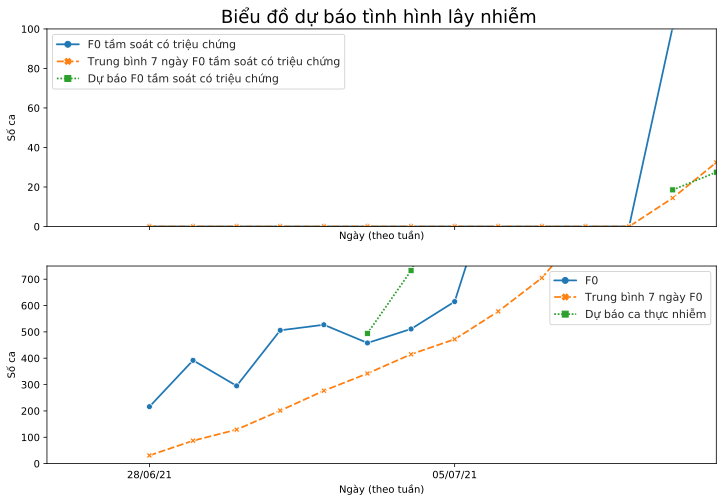

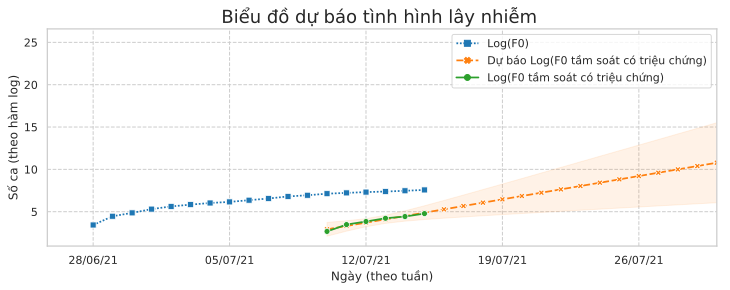

In [62]:
plotCases(f0_ve)
plotCasesLog(log_f0_ve)

### Kịch bản cao

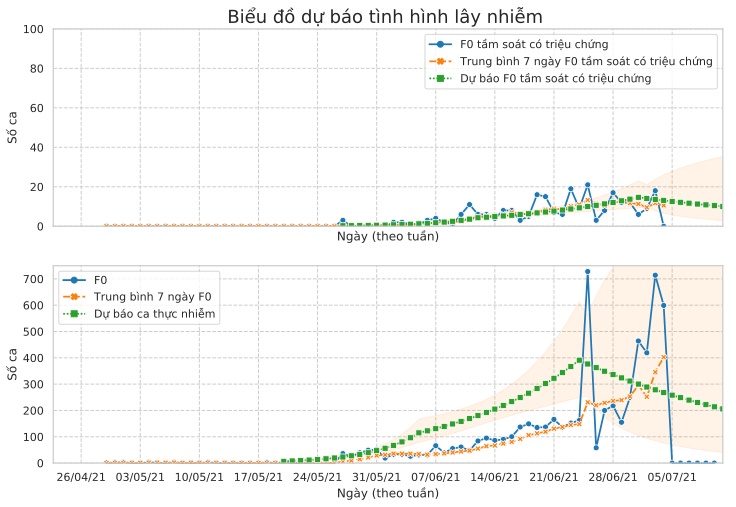

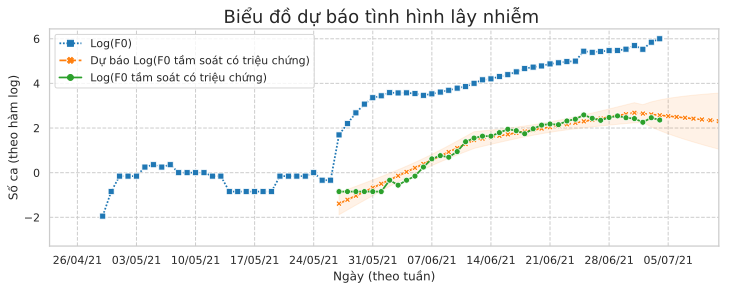

In [227]:
plotCases(f0_ve_kbc)
plotCasesLog(log_f0_ve_kbc)

### Kịch bản thấp

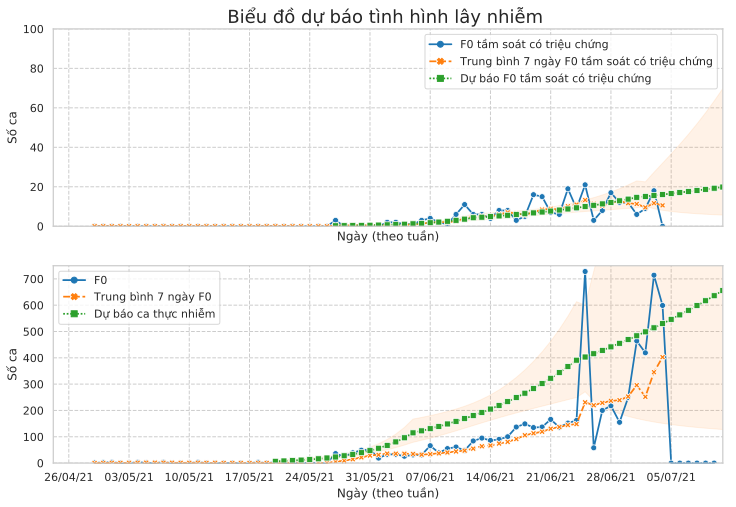

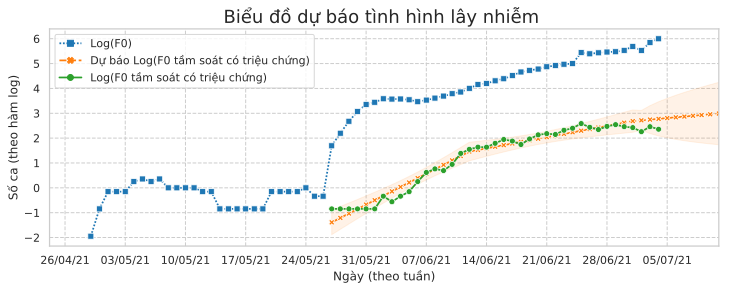

In [228]:
plotCases(f0_ve_kbt)
plotCasesLog(log_f0_ve_kbt)

# Quận/Huyện nguy cơ cao 

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.083800095623891
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0789930732352868
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0859450919908902
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9569498358489168
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0831002501537024
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0238556331837072
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1055017672361678
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9882292986017415
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1435631588432726
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9917081140930932
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.00408524930889
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.022436676460618
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0366698458728787
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1

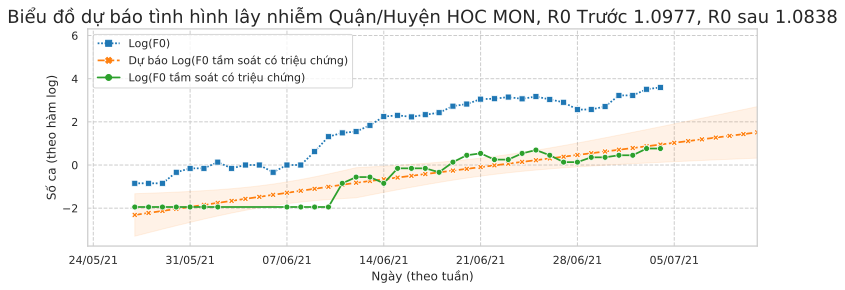

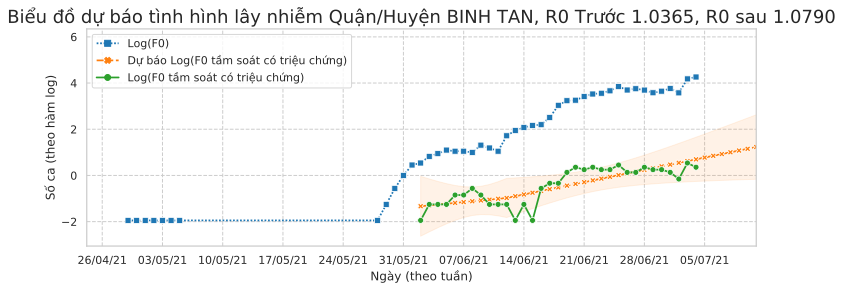

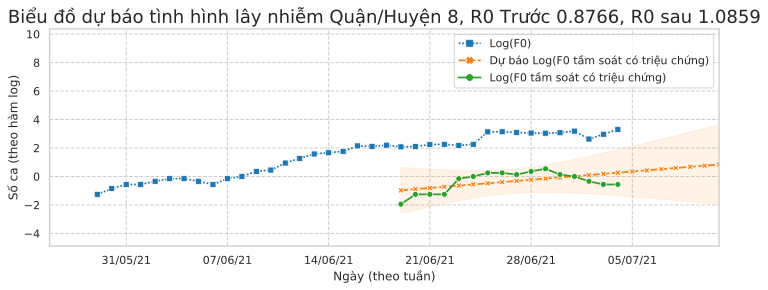

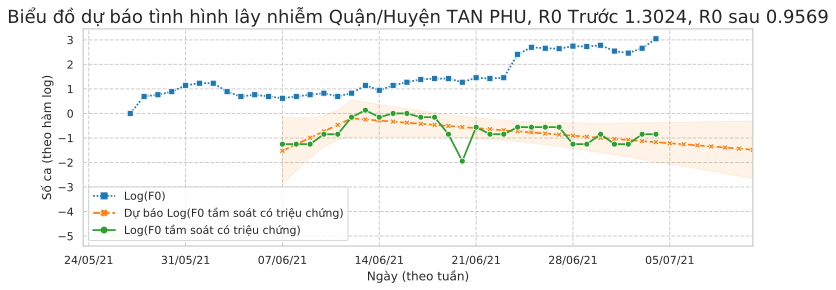

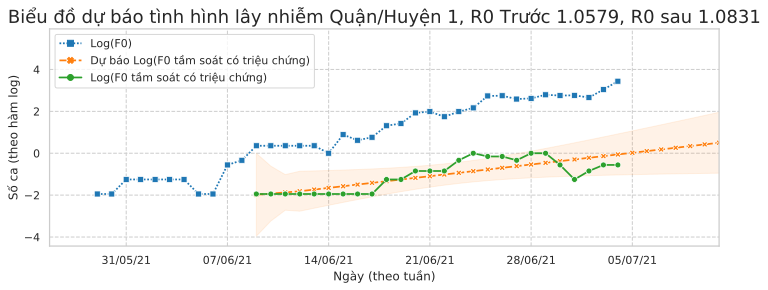

...

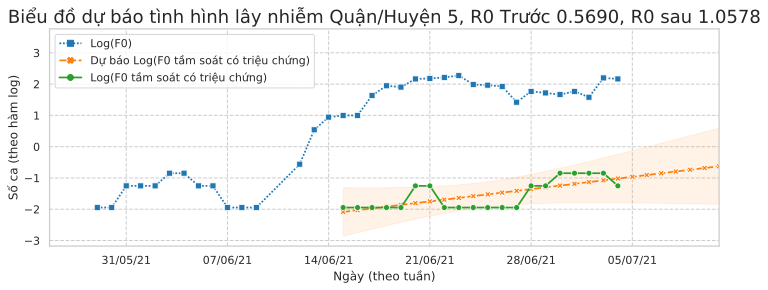

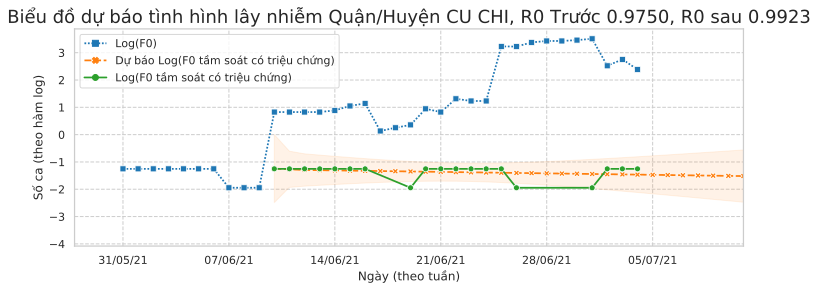

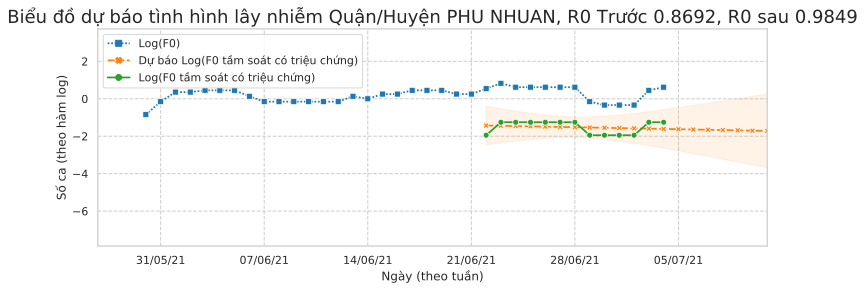

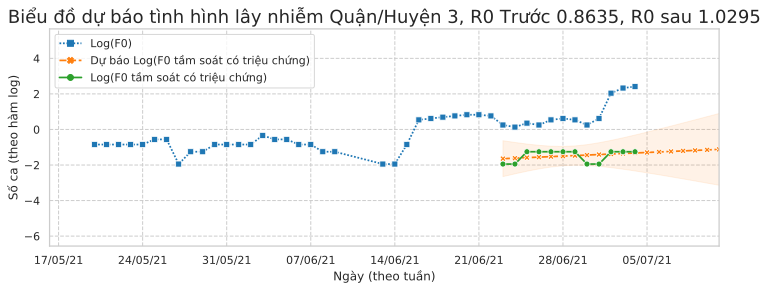

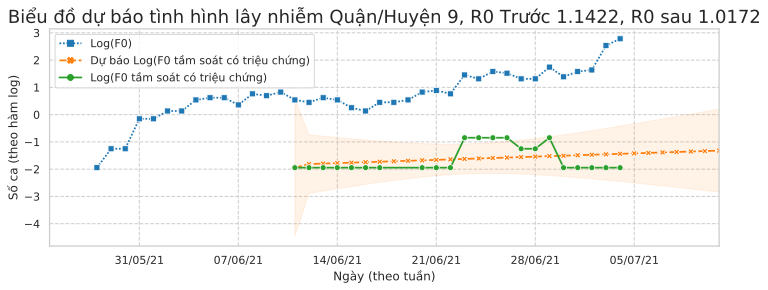

In [229]:
for district in top.index.values:
  log_f0_ve_qh, f0_ve_qh, cumulative_f0_ve_qh, beta_qh = get_metrics_VN(district=district, policy_change_dates = ['2021-06-01'])#, last_data_date=pd.to_datetime('2021-06-25'), back_test=True)
  R0_after_qh = np.exp(sum(beta_qh[1:]))
  R0_before_qh = np.exp(beta_qh[1])
  plotCasesLog(log_f0_ve_qh, place="Quận/Huyện {}, R0 Trước {:.4f}, R0 sau {:.4f}".format(district, R0_before_qh, R0_after_qh))

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.083800095623891
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0789930732352868
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0859450919908902
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9569498358489168
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0831002501537024
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0238556331837072
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1055017672361678
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9882292986017415
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.1435631588432726
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 0.9917081140930932
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.00408524930889
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.022436676460618
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.0366698458728787
Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1

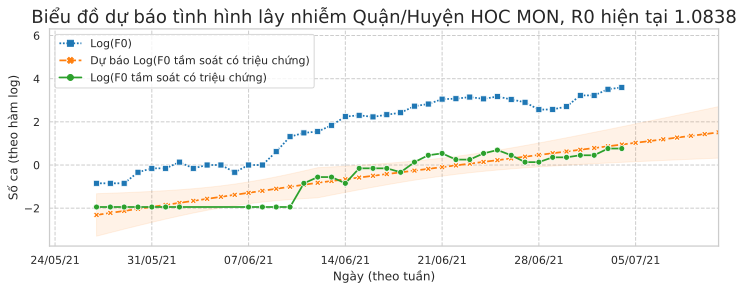

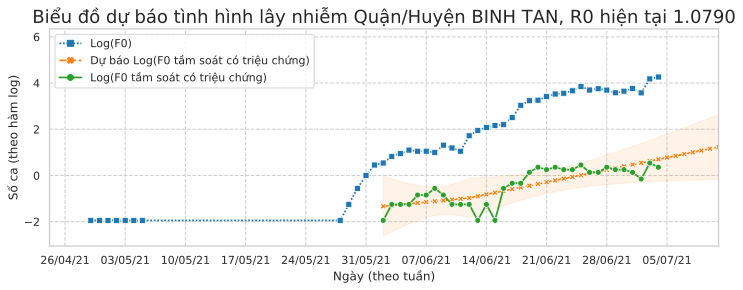

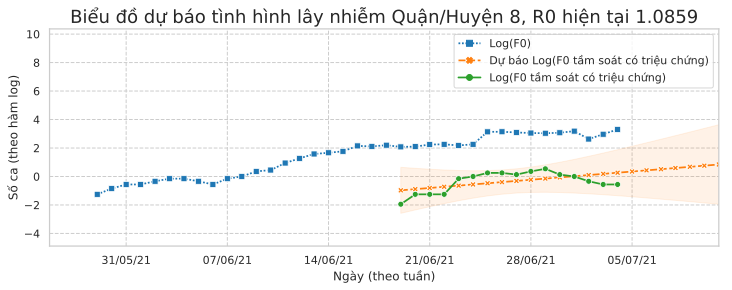

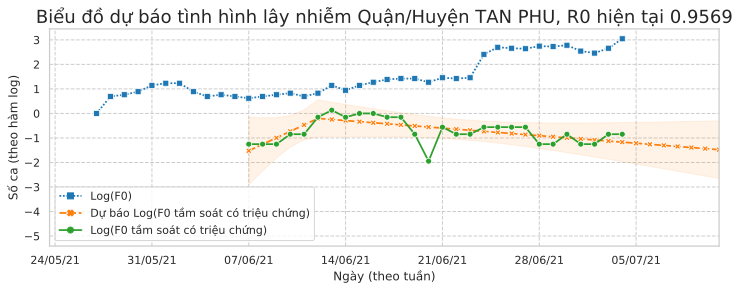

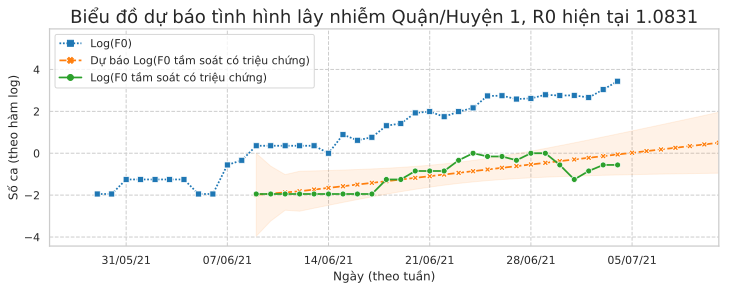

...

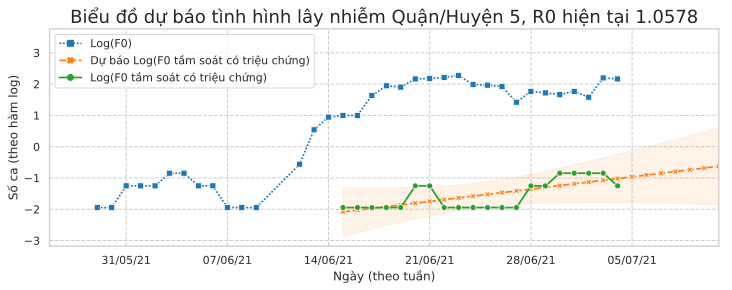

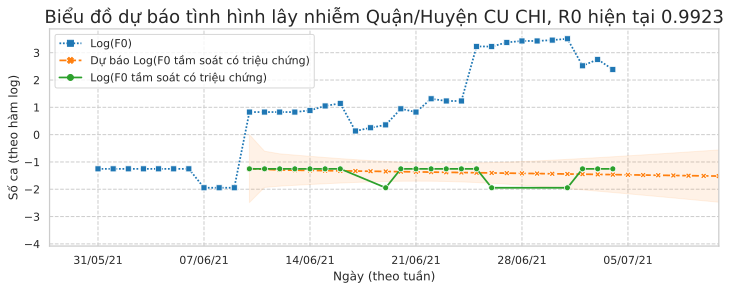

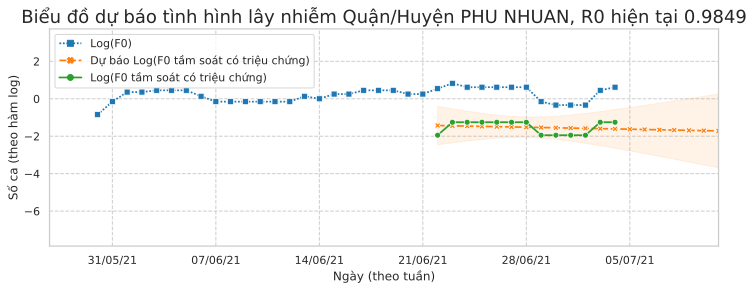

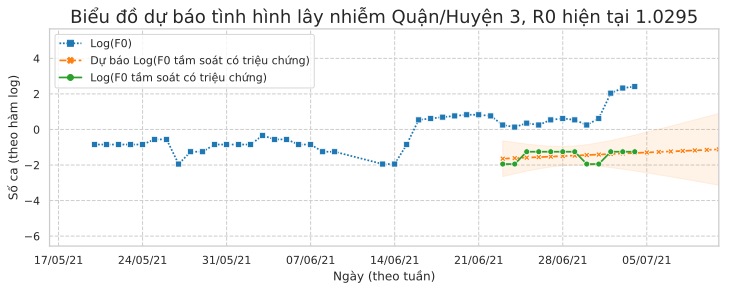

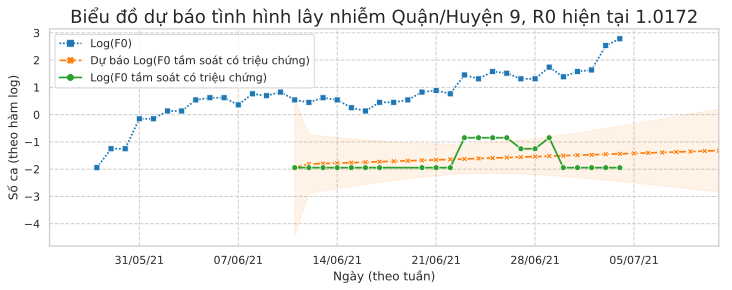

In [230]:
for district in top.index.values:
  log_f0_ve_qh, f0_ve_qh, cumulative_f0_ve_qh, beta_qh = get_metrics_VN(district=district, policy_change_dates = ['2021-06-01'])#, last_data_date=pd.to_datetime('2021-06-25'), back_test=True)
  R0_after_qh = np.exp(sum(beta_qh[1:]))
  R0_before_qh = np.exp(beta_qh[1])
  plotCasesLog(log_f0_ve_qh, place="Quận/Huyện {}, R0 hiện tại {:.4f}".format(district, R0_after_qh))

# New data

In [87]:
log_f0_ve, f0_ve, cumulative_f0_ve, beta = get_metrics_VN(policy_change_dates =['2021-06-20'], forecast_horizon=30, data_file='/home/quoc/Downloads/tphcm_new_format - tphcm_new_format.csv')#,  last_data_date=pd.to_datetime('2021-06-28'), back_test=True)

Hệ số lây nhiễm sau khi chỉ thị có hiệu lực, R0 cuối: 1.4816909298621155


In [88]:
f0_ve.iplot()

In [60]:
log_f0_ve.iplot()